In [21]:
import pandas as pd
import numpy as np
import os
import seaborn as sns

from visual_behavior_glm.glm import GLM
from visual_behavior_glm import GLM_visualization_tools as gvt

import sys
sys.path.append(os.path.split(os.getcwd())[0])
from utilities import helper_functions
import matplotlib.pyplot as plt

In [2]:
%matplotlib notebook

In [3]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [4]:
%load_ext autoreload
%autoreload 2

In [5]:
data_path = os.path.join('~/code/claustrum_imaging_manuscript/data')
session_list = pd.read_csv(os.path.join(os.path.join(data_path,'session_list.csv')))
active_sessions = session_list.query('session_type == "active"')
active_sessions

,mouse_id,sex,genotype,AP_coord,ML_coord,DV_coord,session_type,recording_date,processing_date
18,M332849,M,Gnb4-IRES2-CreERT2/wt;Camk2a-tTA/wt;Ai93(TITL-...,1.5,3.125,2.5,active,2018-06-14 12:44:33.658000,2018-07-26 12:11:01.983524799-07:00
19,M348126,F,Gnb4-IRES2-CreERT2/wt;Camk2a-tTA/wt;Ai94(TITL-...,1.5,2.625,2.5,active,2018-06-13 13:47:38.463000,2018-07-26 18:15:45.828682184-07:00
20,M351181,F,Gnb4-IRES2-CreERT2/wt;Camk2a-tTA/wt;Ai94(TITL-...,1.5,2.625,2.5,active,2018-03-14 14:32:15.328000,2018-07-26 18:59:36.293976068-07:00
21,M397408,F,Gnb4-IRES2-CreERT2/wt;Camk2a-tTA/wt;Ai93(TITL-...,1.5,2.625,2.5,active,2018-11-01 11:40:14.487000,2019-01-22 01:32:10.700291872-08:00


In [6]:
session_dict = {}
for idx,row in active_sessions.reset_index().iterrows():
    session_dict[row['mouse_id']] = helper_functions.load_session(
        row['mouse_id'], 
        session_type='active', 
        data_path = '/home/dougo/code/claustrum_imaging_manuscript/data'
    )
    print('on session {} of {}   '.format(idx+1,len(active_sessions)),end='\r')

In [ ]:
glm_dict = {}
for mouse_id in session_dict.keys():
    session = helper_functions.AllenSDKExperiment(session_dict[mouse_id])

    glm_dict[mouse_id] = GLM(
        ophys_experiment_id = None,
        version = 'claustrum_active',
        NO_DROPOUTS = False,
        TESTING = False,
        log_results=False, 
        log_weights=False,
        gft_import='current',
        session=session
    )

Fitting ophys_experiment_id: None
Loading data
Processing df/f data
Build Design Matrix
    Adding kernel: intercept
    Adding kernel: time
    Adding kernel: licks
    Adding kernel: lick_bouts
    Adding kernel: rewards
    Adding kernel: change
    Adding kernel: hits
    Adding kernel: misses
    Adding kernel: passive_change
	Error encountered while adding kernel for passive_change. Attemping to continue without this kernel.
	Passive Change kernel cant be added to active sessions
    Adding kernel: false_alarms
    Adding kernel: correct_rejects
    Adding kernel: running
                 : Normalized by max value: 100
    Adding kernel: image0
    Adding kernel: image1
    Adding kernel: image2
    Adding kernel: image3
    Adding kernel: image4
    Adding kernel: image5
    Adding kernel: image6
    Adding kernel: image7
The following kernels failed to be added to the model: 
{'passive_change'}

The following dropouts failed to be added to the model: 
{'pupil_and_omissions', 's

    Fitting L2, 500.0: 100%|██████████| 5/5 [00:05<00:00,  1.01s/it]


Setting up model selection dropout
Iterating over model selection
Using a constant regularization value across all cells


    Fitting model, false_alarms:  40%|████      | 2/5 [00:20<00:31, 10.46s/it]/home/dougo/anaconda3/envs/vba/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
    Fitting model, single-false_alarms:  40%|████      | 2/5 [00:19<00:29,  9.93s/it]/home/dougo/anaconda3/envs/vba/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
    Bootstrapping with 100 regressors:   0%|          | 0/5 [00:00<?, ?it/s]

Starting diagnostics
Bootstrapping synthetic data


    Shuffling by cells:   0%|          | 0/50 [00:00<?, ?it/s]

Evaluating shuffle fits


    Shuffling by time: 100%|██████████| 50/50 [00:08<00:00,  6.20it/s]


Saving results
Saving Events Table
Finished
done fitting model, collecting results
done collecting results
done building GLM object
Fitting ophys_experiment_id: None
Loading data
Processing df/f data
Build Design Matrix
    Adding kernel: intercept
    Adding kernel: time
    Adding kernel: licks
    Adding kernel: lick_bouts
    Adding kernel: rewards
    Adding kernel: change
    Adding kernel: hits
    Adding kernel: misses
    Adding kernel: passive_change
	Error encountered while adding kernel for passive_change. Attemping to continue without this kernel.
	Passive Change kernel cant be added to active sessions
    Adding kernel: false_alarms
    Adding kernel: correct_rejects
    Adding kernel: running
                 : Normalized by max value: 100
    Adding kernel: image0
    Adding kernel: image1
    Adding kernel: image2
    Adding kernel: image3
    Adding kernel: image4
    Adding kernel: image5
    Adding kernel: image6
    Adding kernel: image7
The following kernels faile

    Fitting L2, 0.1:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 0.1:  40%|████      | 2/5 [00:01<00:02,  1.03it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 0.1:  60%|██████    | 3/5 [00:03<00:02,  1.04s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_

    Fitting L2, 51.37179487179487:  60%|██████    | 3/5 [00:03<00:02,  1.06s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 51.37179487179487:  80%|████████  | 4/5 [00:04<00:01,  1.10s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 64.18974358974359:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/work

    Fitting L2, 115.46153846153845:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 115.46153846153845:  40%|████      | 2/5 [00:02<00:02,  1.01it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 115.46153846153845:  60%|██████    | 3/5 [00:03<00:02,  1.05s/it]/allen/programs/braintv/w

    Fitting L2, 166.73333333333332:  60%|██████    | 3/5 [00:03<00:02,  1.05s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 166.73333333333332:  80%|████████  | 4/5 [00:04<00:01,  1.08s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 179.55128205128202:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/w

    Fitting L2, 230.8230769230769:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 230.8230769230769:  40%|████      | 2/5 [00:02<00:02,  1.01it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 230.8230769230769:  60%|██████    | 3/5 [00:03<00:02,  1.05s/it]/allen/programs/braintv/work

    Fitting L2, 282.0948717948718:  60%|██████    | 3/5 [00:03<00:02,  1.06s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 282.0948717948718:  80%|████████  | 4/5 [00:04<00:01,  1.08s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 294.91282051282053:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/wor

    Fitting L2, 346.18461538461537:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 346.18461538461537:  40%|████      | 2/5 [00:02<00:03,  1.02s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 346.18461538461537:  60%|██████    | 3/5 [00:03<00:02,  1.07s/it]/allen/programs/braintv/w

    Fitting L2, 397.45641025641027:  60%|██████    | 3/5 [00:03<00:02,  1.06s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 397.45641025641027:  80%|████████  | 4/5 [00:04<00:01,  1.08s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 410.27435897435896:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/w

    Fitting L2, 461.54615384615386:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 461.54615384615386:  40%|████      | 2/5 [00:02<00:03,  1.01s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 461.54615384615386:  60%|██████    | 3/5 [00:03<00:02,  1.06s/it]/allen/programs/braintv/w

Setting up model selection dropout
Iterating over model selection
Using a constant regularization value across all cells


/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, Full:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, Full:  40%|████      | 2/5 [00:02<00:04,  1.37s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning

    Fitting model, licks:  80%|████████  | 4/5 [00:34<00:08,  8.67s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, licks: 100%|██████████| 5/5 [00:43<00:00,  8.66s/it]
/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, lick_bouts:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/

    Fitting model, hits:  60%|██████    | 3/5 [00:25<00:17,  8.58s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, hits:  80%|████████  | 4/5 [00:34<00:08,  8.60s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, hits: 100%|██████████| 5/5 [00:43<00:00,  8.60s/it]
/allen/programs/braintv/workgroups/nc-ophys/Doug/

    Fitting model, image0:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
/home/dougo/anaconda3/envs/vba/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
    Fitting model, image0:  40%|████      | 2/5 [00:17<00:25,  8.61s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regres

    Fitting model, image3:  80%|████████  | 4/5 [00:34<00:08,  8.71s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, image3: 100%|██████████| 5/5 [00:43<00:00,  8.70s/it]
/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, image4:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/co

    Fitting model, image7:  60%|██████    | 3/5 [00:26<00:17,  8.69s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, image7:  80%|████████  | 4/5 [00:34<00:08,  8.71s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, image7: 100%|██████████| 5/5 [00:43<00:00,  8.70s/it]
/allen/programs/braintv/workgroups/nc-ophys

    Fitting model, task:  40%|████      | 2/5 [00:16<00:23,  7.99s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, task:  60%|██████    | 3/5 [00:24<00:16,  8.02s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, task:  80%|████████  | 4/5 [00:32<00:08,  8.02s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/c

Starting diagnostics
Bootstrapping synthetic data


/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
/home/dougo/anaconda3/envs/vba/lib/python3.8/site-packages/xarray/core/nputils.py:215: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
    Bootstrapping with 100 regressors:  40%|████      | 2/5 [00:02<00:03,  1.31s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are

/home/dougo/anaconda3/envs/vba/lib/python3.8/site-packages/xarray/core/nputils.py:215: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
    Bootstrapping with 400 regressors:  40%|████      | 2/5 [00:02<00:03,  1.30s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
/home/dougo/anaconda3/envs/vba/lib/python3.8/site-packages/xarray/core/nputils.py:215: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
    Bootstrapping with 400 regressors:  60%|██████    | 3/5 [00:04<00:02,  1.36s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visu

    Bootstrapping with 700 regressors:  40%|████      | 2/5 [00:02<00:03,  1.30s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
/home/dougo/anaconda3/envs/vba/lib/python3.8/site-packages/xarray/core/nputils.py:215: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
    Bootstrapping with 700 regressors:  60%|██████    | 3/5 [00:04<00:02,  1.36s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There a

/home/dougo/anaconda3/envs/vba/lib/python3.8/site-packages/xarray/core/nputils.py:215: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
    Bootstrapping with 1000 regressors:  60%|██████    | 3/5 [00:04<00:02,  1.35s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
/home/dougo/anaconda3/envs/vba/lib/python3.8/site-packages/xarray/core/nputils.py:215: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
    Bootstrapping with 1000 regressors:  80%|████████  | 4/5 [00:05<00:01,  1.38s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/vi

    Bootstrapping with 1300 regressors:  60%|██████    | 3/5 [00:04<00:02,  1.36s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
/home/dougo/anaconda3/envs/vba/lib/python3.8/site-packages/xarray/core/nputils.py:215: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
    Bootstrapping with 1300 regressors:  80%|████████  | 4/5 [00:05<00:01,  1.39s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There

Evaluating shuffle fits


    Shuffling by time: 100%|██████████| 50/50 [00:07<00:00,  6.59it/s]


Saving results
Saving Events Table
Finished
done fitting model, collecting results
done collecting results
done building GLM object
Fitting ophys_experiment_id: None
Loading data
Processing df/f data
Build Design Matrix
    Adding kernel: intercept
    Adding kernel: time
    Adding kernel: licks
    Adding kernel: lick_bouts
    Adding kernel: rewards
    Adding kernel: change
    Adding kernel: hits
    Adding kernel: misses
    Adding kernel: passive_change
	Error encountered while adding kernel for passive_change. Attemping to continue without this kernel.
	Passive Change kernel cant be added to active sessions
    Adding kernel: false_alarms
	Error encountered while adding kernel for false_alarms. Attemping to continue without this kernel.
	Less than minimum number of events: 4 false_alarm
    Adding kernel: correct_rejects
    Adding kernel: running
                 : Normalized by max value: 100
    Adding kernel: image0
    Adding kernel: image1
    Adding kernel: image2
    Ad

    Fitting L2, 0.1:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 0.1:  20%|██        | 1/5 [00:01<00:04,  1.01s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 0.1:  60%|██████    | 3/5 [00:02<00:01,  1.04it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_

    Fitting L2, 51.37179487179487:  60%|██████    | 3/5 [00:03<00:01,  1.02it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 51.37179487179487:  80%|████████  | 4/5 [00:04<00:01,  1.01s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 64.18974358974359:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/work

    Fitting L2, 115.46153846153845:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 115.46153846153845:  20%|██        | 1/5 [00:01<00:04,  1.04s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 115.46153846153845:  60%|██████    | 3/5 [00:02<00:01,  1.04it/s]/allen/programs/braintv/w

    Fitting L2, 166.73333333333332:  60%|██████    | 3/5 [00:02<00:01,  1.04it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 166.73333333333332:  80%|████████  | 4/5 [00:04<00:00,  1.00it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 179.55128205128202:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/w

    Fitting L2, 230.8230769230769:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 230.8230769230769:  20%|██        | 1/5 [00:01<00:04,  1.04s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 230.8230769230769:  60%|██████    | 3/5 [00:02<00:01,  1.04it/s]/allen/programs/braintv/work

    Fitting L2, 282.0948717948718:  60%|██████    | 3/5 [00:02<00:01,  1.04it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 282.0948717948718:  80%|████████  | 4/5 [00:03<00:00,  1.01it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 294.91282051282053:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/wor

    Fitting L2, 346.18461538461537:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 346.18461538461537:  20%|██        | 1/5 [00:01<00:04,  1.03s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 346.18461538461537:  60%|██████    | 3/5 [00:02<00:01,  1.05it/s]/allen/programs/braintv/w

    Fitting L2, 397.45641025641027:  60%|██████    | 3/5 [00:02<00:01,  1.05it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 397.45641025641027:  80%|████████  | 4/5 [00:03<00:00,  1.01it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 410.27435897435896:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/w

    Fitting L2, 461.54615384615386:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 461.54615384615386:  20%|██        | 1/5 [00:01<00:04,  1.04s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting L2, 461.54615384615386:  60%|██████    | 3/5 [00:02<00:01,  1.03it/s]/allen/programs/braintv/w

Setting up model selection dropout
Iterating over model selection
Using a constant regularization value across all cells


/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, Full:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, Full:  20%|██        | 1/5 [00:01<00:06,  1.52s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning

    Fitting model, licks:  80%|████████  | 4/5 [00:38<00:09,  9.63s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, licks: 100%|██████████| 5/5 [00:48<00:00,  9.64s/it]
/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, lick_bouts:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/

    Fitting model, hits:  60%|██████    | 3/5 [00:28<00:19,  9.58s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, hits:  80%|████████  | 4/5 [00:38<00:09,  9.61s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, hits: 100%|██████████| 5/5 [00:48<00:00,  9.63s/it]
/allen/programs/braintv/workgroups/nc-ophys/Doug/

    Fitting model, image1:  20%|██        | 1/5 [00:09<00:36,  9.22s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, image1:  60%|██████    | 3/5 [00:27<00:18,  9.07s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, image1:  80%|████████  | 4/5 [00:36<00:09,  9.09s/it]/allen/programs/braintv/workgroups/nc-ophys/

    Fitting model, image5:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, image5:  20%|██        | 1/5 [00:09<00:36,  9.12s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, image5:  60%|██████    | 3/5 [00:27<00:17,  8.99s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/cod

    Fitting model, visual: 100%|██████████| 5/5 [00:48<00:00,  9.69s/it]
/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, all-images:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, all-images:  20%|██        | 1/5 [00:09<00:38,  9.75s/it]/allen/programs/braintv/workgroups/nc-ophys

    Fitting model, licking:  80%|████████  | 4/5 [00:37<00:09,  9.29s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, single-correct_rejects: 100%|██████████| 5/5 [00:40<00:00,  8.11s/it]
/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
    Fitting model, single-running:   0%|          | 0/5 [00:00<?, ?it/s]/allen/programs/braintv/wo

Starting diagnostics
Bootstrapping synthetic data


/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
/home/dougo/anaconda3/envs/vba/lib/python3.8/site-packages/xarray/core/nputils.py:215: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
    Bootstrapping with 100 regressors:  20%|██        | 1/5 [00:01<00:05,  1.38s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are

/home/dougo/anaconda3/envs/vba/lib/python3.8/site-packages/xarray/core/nputils.py:215: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
    Bootstrapping with 400 regressors:  20%|██        | 1/5 [00:01<00:05,  1.39s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
/home/dougo/anaconda3/envs/vba/lib/python3.8/site-packages/xarray/core/nputils.py:215: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
    Bootstrapping with 400 regressors:  60%|██████    | 3/5 [00:03<00:02,  1.30s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visu

    Bootstrapping with 700 regressors:  20%|██        | 1/5 [00:01<00:05,  1.38s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
/home/dougo/anaconda3/envs/vba/lib/python3.8/site-packages/xarray/core/nputils.py:215: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
    Bootstrapping with 700 regressors:  60%|██████    | 3/5 [00:03<00:02,  1.29s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There a

/home/dougo/anaconda3/envs/vba/lib/python3.8/site-packages/xarray/core/nputils.py:215: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
    Bootstrapping with 1000 regressors:  60%|██████    | 3/5 [00:03<00:02,  1.30s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/visual_behavior_glm/visual_behavior_glm/GLM_fit_tools.py:1590: UserWarning: There are NaNs in the design matrix associated with the following regressors.
[]
They are being set to 0.
  warnings.warn('There are NaNs in the design matrix associated with the following regressors.\n{}\nThey are being set to 0.'.format(
/home/dougo/anaconda3/envs/vba/lib/python3.8/site-packages/xarray/core/nputils.py:215: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
    Bootstrapping with 1000 regressors:  80%|████████  | 4/5 [00:05<00:01,  1.34s/it]/allen/programs/braintv/workgroups/nc-ophys/Doug/code/vi

Evaluating shuffle fits


    Shuffling by time: 100%|██████████| 50/50 [00:07<00:00,  6.48it/s]


Saving results
Saving Events Table
Finished
done fitting model, collecting results
done collecting results
done building GLM object
Fitting ophys_experiment_id: None
Loading data
Processing df/f data
Build Design Matrix
    Adding kernel: intercept
    Adding kernel: time
    Adding kernel: licks
    Adding kernel: lick_bouts
    Adding kernel: rewards
    Adding kernel: change
    Adding kernel: hits
    Adding kernel: misses
    Adding kernel: passive_change
	Error encountered while adding kernel for passive_change. Attemping to continue without this kernel.
	Passive Change kernel cant be added to active sessions
    Adding kernel: false_alarms
    Adding kernel: correct_rejects
    Adding kernel: running
                 : Normalized by max value: 100
    Adding kernel: image0
    Adding kernel: image1
    Adding kernel: image2
    Adding kernel: image3
    Adding kernel: image4
    Adding kernel: image5
    Adding kernel: image6
    Adding kernel: image7
The following kernels faile

    Fitting L2, 25.735897435897435:  20%|██        | 1/5 [00:00<00:03,  1.13it/s]

In [36]:
results = []
dropout_summary = []
for key in glm_dict.keys():
    glm = glm_dict[key]
    # add the results for this mouse
    glm.results['mouse_id'] = key
    results.append(glm.results)
    
    # add the dropout summary for this mouse (this is pivoted results)
    dropout_summary.append(glm.dropout_summary)
results = pd.concat(results).sort_values(by='Full__avg_cv_var_test', ascending=False)
dropout_summary = pd.concat(dropout_summary)
results.head(20)

<ipython-input-36-81f7a7e99712>:11: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  results = pd.concat(results).sort_values(by='Full__avg_cv_var_test', ascending=False)


,Full__absolute_change_from_full,Full__adj_dropout,Full__avg_cv_adjvar_test,Full__avg_cv_adjvar_test_full_comparison,Full__avg_cv_adjvar_train,Full__avg_cv_var_test,Full__avg_cv_var_test_full_comparison,Full__avg_cv_var_train,Full__dropout,all-images__absolute_change_from_full,...,time__dropout,visual__absolute_change_from_full,visual__adj_dropout,visual__avg_cv_adjvar_test,visual__avg_cv_adjvar_test_full_comparison,visual__avg_cv_adjvar_train,visual__avg_cv_var_test,visual__avg_cv_var_test_full_comparison,visual__avg_cv_var_train,visual__dropout
cell_specimen_id,,,,,,,,,,,,,,,,,,,,,
M348126_C030,0.0,-0.0,0.777433,0.777433,0.788911,0.777433,0.777433,0.788911,-0.0,0.001543,...,-0.000389,0.001543,0.000000,0.780199,0.778649,0.789428,0.778976,0.777433,0.788024,0.000000
M332849_C020,0.0,-0.0,0.679699,0.679699,0.704689,0.679699,0.679699,0.704689,-0.0,0.000380,...,-0.005123,0.000380,0.000000,0.680076,0.679696,0.703815,0.680079,0.679699,0.703815,0.000000
M348126_C023,0.0,-0.0,0.630711,0.630711,0.658757,0.630711,0.630711,0.658757,-0.0,0.002078,...,-0.001799,0.002078,0.000000,0.632821,0.630744,0.657250,0.632790,0.630711,0.657231,0.000000
M348126_C086,0.0,-0.0,0.610408,0.610408,0.657637,0.610408,0.610408,0.657637,-0.0,-0.000082,...,-0.004822,-0.000082,-0.000129,0.611078,0.611156,0.656801,0.610326,0.610408,0.656646,-0.000134
M348126_C041,0.0,-0.0,0.605647,0.605647,0.663460,0.605647,0.605647,0.663460,-0.0,0.000405,...,-0.032921,0.000405,0.000000,0.606348,0.605942,0.661458,0.606052,0.605647,0.661405,0.000000
M348126_C101,0.0,-0.0,0.566149,0.566149,0.594101,0.566149,0.566149,0.594101,-0.0,0.000557,...,-0.016879,0.000557,0.000000,0.566961,0.566404,0.592569,0.566706,0.566149,0.592547,0.000000
M348126_C064,0.0,-0.0,0.559254,0.559254,0.594155,0.559254,0.559254,0.594155,-0.0,0.002400,...,-0.004773,0.002400,0.000000,0.562175,0.559779,0.591974,0.561655,0.559254,0.591727,0.000000
M348126_C080,0.0,-0.0,0.556290,0.556290,0.604321,0.556290,0.556290,0.604321,-0.0,0.001771,...,-0.016750,0.001771,0.000000,0.558713,0.556935,0.603340,0.558061,0.556290,0.603206,0.000000
M348126_C050,0.0,-0.0,0.548036,0.548036,0.597706,0.548036,0.548036,0.597706,-0.0,0.000976,...,-0.026095,0.000976,0.000000,0.549317,0.548334,0.596128,0.549012,0.548036,0.595997,0.000000


<IPython.core.display.Javascript object>


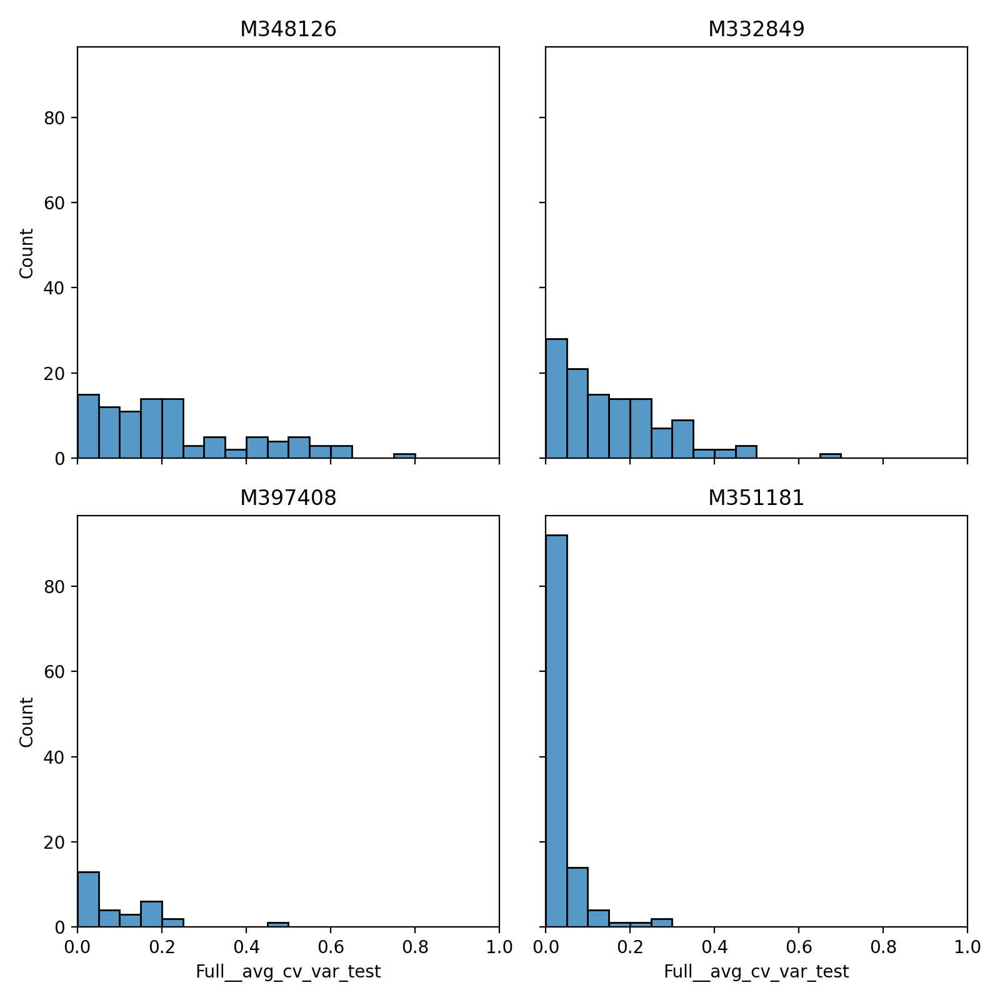

In [52]:
fig, ax = plt.subplots(2,2, figsize=(8,8), sharex=True, sharey=True)
for ii, mouse_id in enumerate(results['mouse_id'].unique()):
    sns.histplot(
        data = results.query('mouse_id == @mouse_id'),
        x = 'Full__avg_cv_var_test',
        ax = ax.flatten()[ii],
        bins = np.arange(0, 1, 0.05)
    )
    ax.flatten()[ii].set_xlim(0,1)
    ax.flatten()[ii].set_title(mouse_id)
fig.tight_layout()

<IPython.core.display.Javascript object>


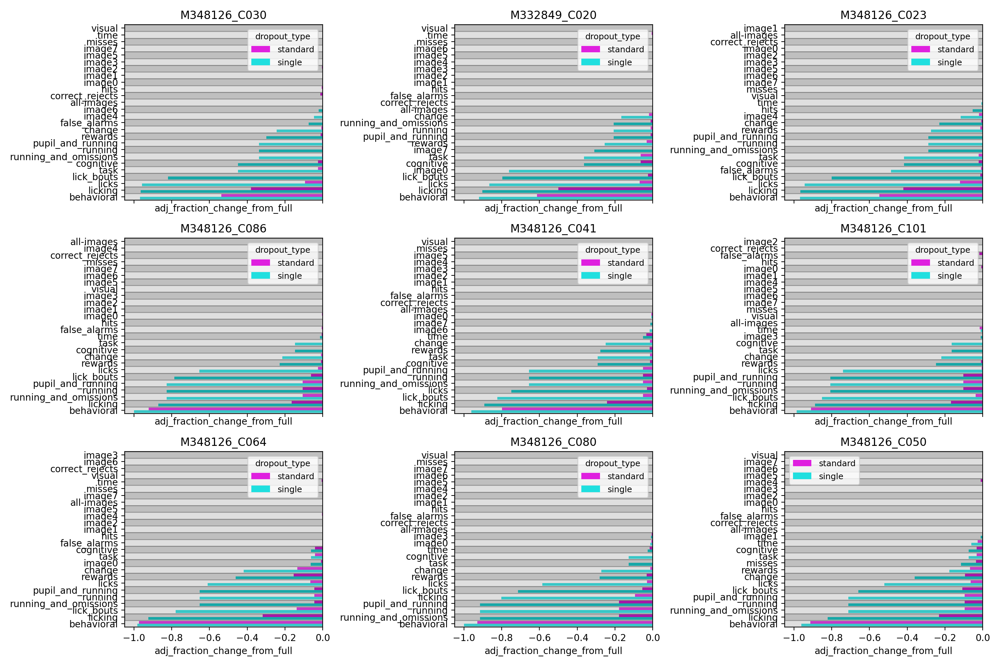

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [49]:
fig, ax = plt.subplots(3,3, figsize=(15,10), sharex=True)
for ii, csid in enumerate(results.iloc[:9].index):
    gvt.plot_dropout_summary(
        dropout_summary,
        cell_specimen_id = csid,
        ax = ax.flatten()[ii],
        ylabel_fontsize=10, 
        ticklabel_fontsize=10, 
        title_fontsize=10, 
        legend_fontsize=9,
    )
    ax.flatten()[ii].set_title(csid)
fig.tight_layout()

In [115]:
def get_dropout_df(cell_id, dropout_summary):
    '''
    gets limited dropout df for this cell
    '''
    dropouts_of_interest = [
        'single-all-images',
        'single-change',
        'single-hits',
        'single-misses',
        'single-false_alarms',
        'single-correct_rejects',
        'single-lick_bouts',
        'single-licks',
        'single-running'
    ]
    dropout_df = dropout_summary.query('cell_specimen_id in @cell_id and dropout in @dropouts_of_interest').set_index('dropout')
    return dropout_df
    

def get_top_dropout(cell_id, dropout_summary):
    '''
    gets the single dropout that explains most variance for this cell
    '''
    
    dropout_df = get_dropout_df(cell_id, dropout_summary)
    top_dropout = dropout_df['variance_explained'].idxmax()
    return top_dropout

In [137]:
def plot_cell(ax, glm, cell_id, t0, t1, legend=True):
    
    df = glm.cell_results_df.query('cell_specimen_id == @cell_id').query('fit_trace_timestamps > @t0 and fit_trace_timestamps < @t1')

    ax.plot(df['fit_trace_timestamps'], df['fit_array'])
    ax.plot(df['fit_trace_timestamps'], df['model_prediction'])

    # plot licks as black dots
    licks = glm.session.licks.query('timestamps > @t0 and timestamps < @t1')
    ax.plot(
        licks['timestamps'],
        np.zeros_like(licks['timestamps']),
        marker = 'o',
        linestyle = 'none',
        color = 'black'
    )

    # plot rewards as blue dots
    rewards = glm.session.rewards.query('timestamps > @t0 and timestamps < @t1')
    ax.plot(
        rewards['timestamps'],
        np.zeros_like(rewards['timestamps']),
        marker = 'o',
        linestyle = 'none',
        color = 'blue'
    )

    # plot changes as vertical lines
    changes = glm.session.stimulus_presentations.query('start_time > @t0 and start_time < @t1 and change')
    for change_time in changes['start_time']:
        ax.axvline(change_time)

    if legend==True:
        ax.legend(['z-scored dff', 'model prediction'])
    ax.set_xlabel('time (s)')

    top_dropout = get_top_dropout(cell_id, dropout_summary)
    ax.set_title('cell_id: {}, var_explained: {:0.4f}\ntop dropout = {}'.format(
        cell_id, 
        glm.results.loc[cell_id]['Full__avg_cv_adjvar_test'],
        top_dropout
    ))

<IPython.core.display.Javascript object>


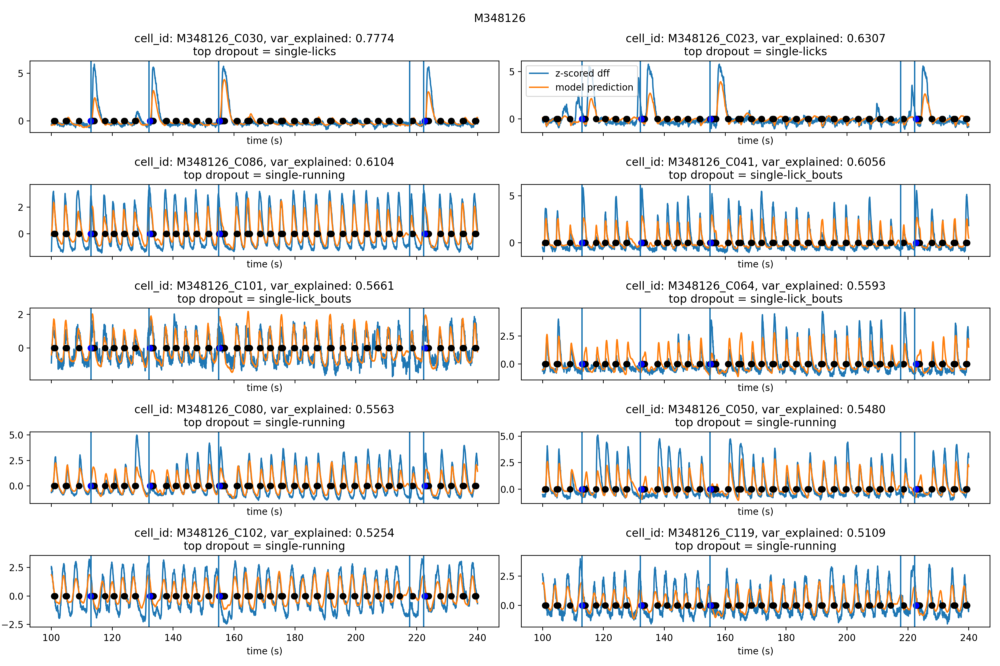

<IPython.core.display.Javascript object>


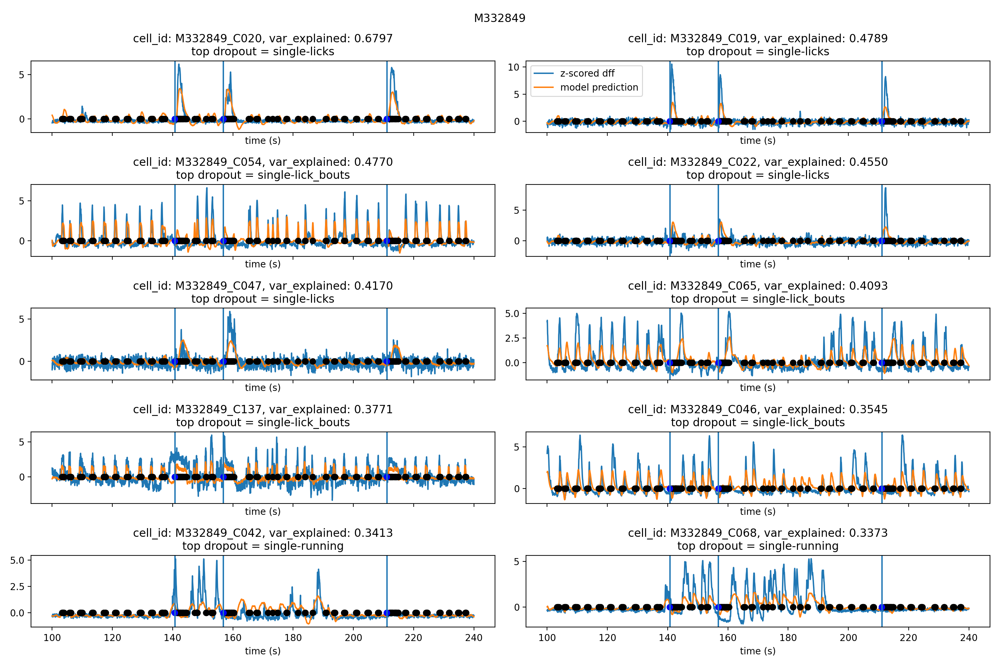

<IPython.core.display.Javascript object>


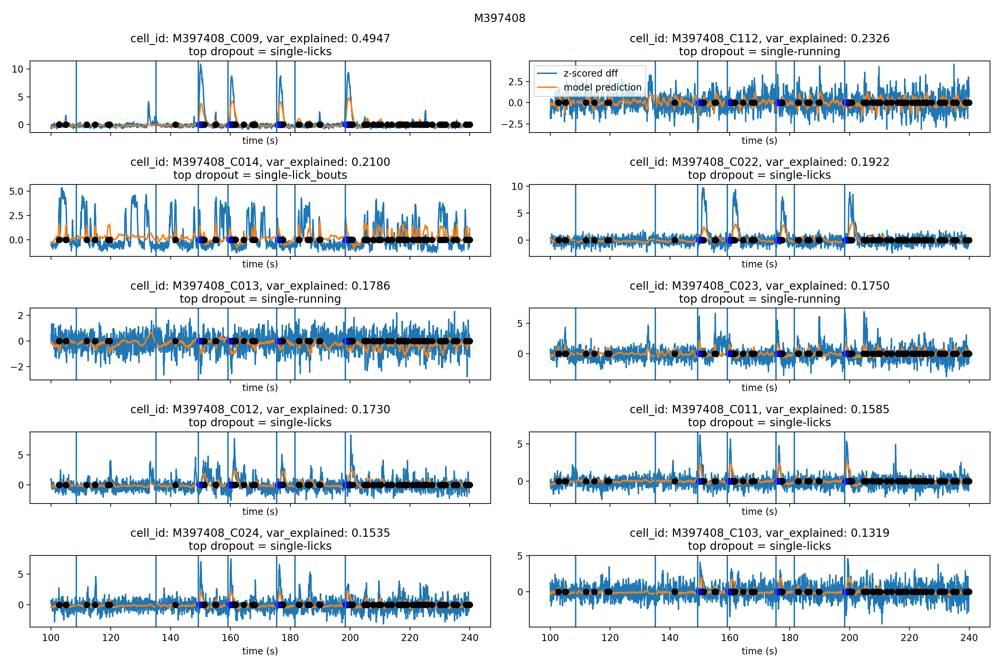

<IPython.core.display.Javascript object>


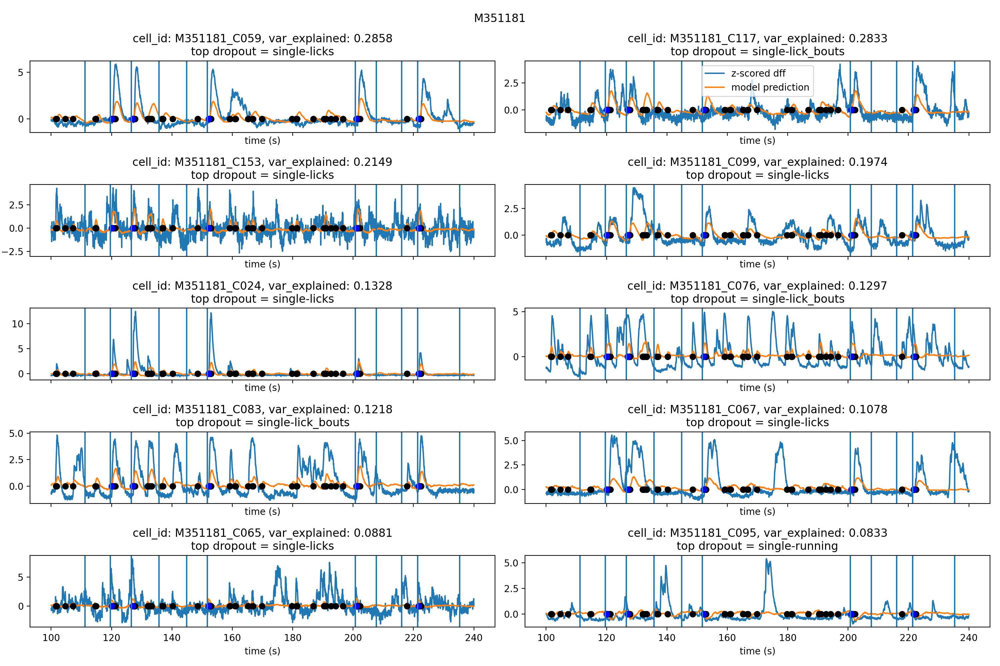

In [136]:
t0 = 100
t1 = 240

for ii, mouse_id in enumerate(results['mouse_id'].unique()): #enumerate(['M348126', 'M332849', 'M397408', 'M351181']): 
    
    glm = glm_dict[mouse_id]
    # look at the top 10 cells for this mouse
    data = glm.results.sort_values(by='Full__avg_cv_var_test', ascending=False).iloc[:10]
    
    fig, ax = plt.subplots(5, 2, figsize = (15,10), sharex=True)
    
    for ii,cell_id in enumerate(data.index):
        legend = True if ii == 1 else False

        plot_cell(ax.flatten()[ii], glm, cell_id, t0, t1, legend=legend)
    
    fig.suptitle(mouse_id)
    fig.tight_layout()
    
    

## I'm curious about one of these cells that had top dropout of 'single-running', but looks like a lick cell

In [140]:
cell_id = 'M348126_C086'
get_dropout_df(cell_id, dropout_summary)

,absolute_change_from_full,variance_explained,variance_explained_full,fraction_change_from_full,cell_specimen_id,adj_fraction_change_from_full,adj_variance_explained,adj_variance_explained_full,cell_roi_id
dropout,,,,,,,,,
single-all-images,-0.610408,0.000000,0.610408,0.000000,M348126_C086,0.000000,0.000000,0.611156,M348126_C086
single-change,-0.584432,0.025976,0.610408,-0.042555,M348126_C086,-0.214606,0.116221,0.541552,M348126_C086
single-correct_rejects,-0.610408,0.000000,0.610408,0.000000,M348126_C086,0.000000,0.000000,0.000000,M348126_C086
single-false_alarms,-0.610408,0.000000,0.610408,0.000000,M348126_C086,0.000000,0.000000,0.399948,M348126_C086
single-hits,-0.610408,0.000000,0.610408,0.000000,M348126_C086,0.000000,0.000000,0.569799,M348126_C086
single-lick_bouts,-0.129549,0.480859,0.610408,-0.787766,M348126_C086,-0.786634,0.483847,0.615085,M348126_C086
single-licks,-0.211414,0.398994,0.610408,-0.653651,M348126_C086,-0.653672,0.402115,0.615164,M348126_C086
single-misses,-0.610408,0.000000,0.610408,0.000000,M348126_C086,0.000000,0.000000,0.268359,M348126_C086
single-running,-0.105852,0.504556,0.610408,-0.826588,M348126_C086,-0.826589,0.504454,0.610284,M348126_C086


<IPython.core.display.Javascript object>


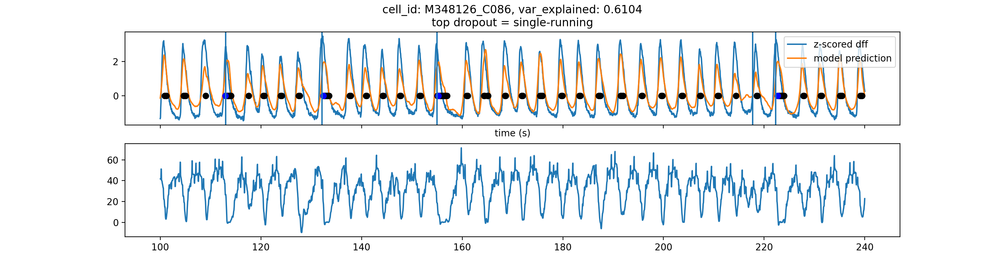

In [141]:
glm = glm_dict['M348126']
    
fig, ax = plt.subplots(2,1, figsize = (15,4), sharex=True)

plot_cell(ax[0], glm, cell_id, t0, t1, legend=True)
running = glm.session.running_speed.query('timestamps >= @t0 and timestamps <= @t1')
ax[1].plot(running['timestamps'], running['speed'])

In [191]:
cell_id = 'M332849_C042'
get_dropout_df(cell_id, dropout_summary)

,absolute_change_from_full,variance_explained,variance_explained_full,fraction_change_from_full,cell_specimen_id,adj_fraction_change_from_full,adj_variance_explained,adj_variance_explained_full,cell_roi_id
dropout,,,,,,,,,
single-all-images,-0.341334,0.000000,0.341334,0.000000,M332849_C042,0.000000,0.000000,0.341585,M332849_C042
single-change,-0.335360,0.005974,0.341334,-0.017502,M332849_C042,-0.058609,0.019945,0.340317,M332849_C042
single-correct_rejects,-0.341232,0.000102,0.341334,0.000000,M332849_C042,0.000000,0.007000,0.000000,M332849_C042
single-false_alarms,-0.341330,0.000004,0.341334,0.000000,M332849_C042,0.000000,0.006223,0.000000,M332849_C042
single-hits,-0.341334,0.000000,0.341334,0.000000,M332849_C042,0.000000,0.000000,0.000000,M332849_C042
single-lick_bouts,-0.287402,0.053932,0.341334,-0.158003,M332849_C042,-0.163944,0.058039,0.354015,M332849_C042
single-licks,-0.292394,0.048940,0.341334,-0.143378,M332849_C042,-0.155221,0.054526,0.351282,M332849_C042
single-misses,-0.340326,0.001008,0.341334,0.000000,M332849_C042,-0.072759,0.031009,0.426192,M332849_C042
single-running,0.006743,0.348077,0.341334,-1.000000,M332849_C042,-1.000000,0.349057,0.342366,M332849_C042


<IPython.core.display.Javascript object>


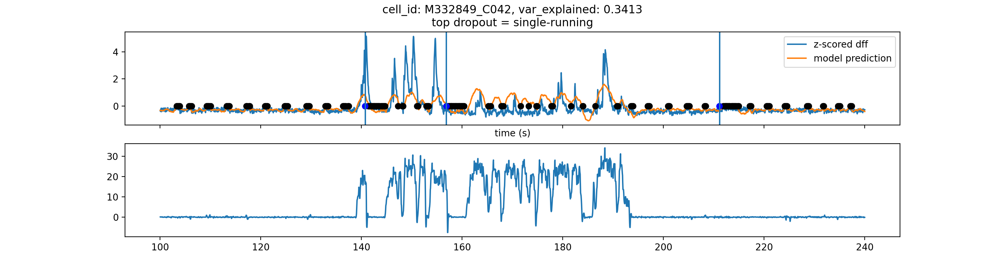

In [192]:
glm = glm_dict['M332849']
    
fig, ax = plt.subplots(2,1, figsize = (15,4), sharex=True)

plot_cell(ax[0], glm, cell_id, t0, t1, legend=True)
running = glm.session.running_speed.query('timestamps >= @t0 and timestamps <= @t1')
ax[1].plot(running['timestamps'], running['speed'])

## build a dataframe with rows for single cells, columns for dropouts

In [206]:
dropouts_of_interest = [
        'single-all-images',
        'single-change',
        'single-hits',
        'single-misses',
        'single-false_alarms',
        'single-correct_rejects',
        'single-lick_bouts',
        'single-licks',
        'single-running'
    ]
dropout_summary_simple = dropout_summary.query('dropout in @dropouts_of_interest').pivot(
    index = 'cell_specimen_id',
    columns = 'dropout',
    values = 'variance_explained'
)
dropout_summary_simple.fillna(0).sample(10)

dropout,single-all-images,single-change,single-correct_rejects,single-false_alarms,single-hits,single-lick_bouts,single-licks,single-misses,single-running
cell_specimen_id,,,,,,,,,
M351181_C115,0.000000,0.000000,0.000000,0.000000,0.000000,0.007931,0.002550,0.000000,0.001271
M351181_C024,0.000000,0.050665,0.000085,0.000000,0.000000,0.080530,0.137652,0.000000,0.058146
M332849_C158,0.000000,0.001694,0.000000,0.000000,0.000000,0.030596,0.028442,0.000000,0.036562
M348126_C125,0.001364,0.050347,0.000000,0.000000,0.000000,0.366070,0.334499,0.000419,0.298998
M351181_C095,0.003196,0.003171,0.000061,0.000000,0.000321,0.017387,0.021743,0.000000,0.081241
M332849_C108,0.000000,0.003181,0.000000,0.000166,0.000734,0.161229,0.140550,0.000272,0.079408
M348126_C006,0.000000,0.003873,0.000002,0.000019,0.000000,0.000000,0.000000,0.000158,0.000000
M332849_C098,0.000297,0.005579,0.000439,0.000007,0.000000,0.112922,0.093580,0.000000,0.162888
M332849_C000,0.000000,0.021895,0.000039,0.000060,0.000000,0.058585,0.063324,0.000000,0.017145


## Normalize each row by its max. This will tell is which dropout(s) explain the most variance for a given cell, regardless of the absolute variance explained for that cell

In [207]:
normalized_dropout_df = []
for idx, row in dropout_summary_simple.iterrows():
    normalized_dropout_df.append((row/row.max()))
normalized_dropout_df = pd.DataFrame(normalized_dropout_df).fillna(0)

normalized_dropout_df['mouse_id'] = None
for idx, row in normalized_dropout_df.iterrows():
    normalized_dropout_df.at[idx, 'mouse_id'] = idx.split('_')[0]
    
normalized_dropout_df.sample(10)

dropout,single-all-images,single-change,single-correct_rejects,single-false_alarms,single-hits,single-lick_bouts,single-licks,single-misses,single-running,mouse_id
M351181_C027,0.271402,0.021241,0.076699,0.000000,0.115466,0.000000,0.000000,0.000000,1.000000,M351181
M332849_C147,0.000000,0.085865,0.001052,0.006097,0.000000,0.645052,0.623922,0.000000,1.000000,M332849
M397408_C022,0.000000,0.214621,0.002008,0.000343,0.001748,0.639630,1.000000,0.000000,0.437228,M397408
M351181_C038,0.000000,0.067115,0.000000,0.000000,0.000000,0.852388,1.000000,0.000000,0.000000,M351181
M351181_C013,0.000000,0.000000,0.019036,0.000000,0.000000,0.000000,1.000000,0.000000,0.221403,M351181
M332849_C035,0.000000,0.163267,0.001178,0.000000,0.000000,1.000000,0.961316,0.000000,0.728615,M332849
M351181_C109,0.008774,0.002007,0.000000,0.000000,0.000000,0.036321,0.072980,0.000000,1.000000,M351181
M332849_C083,0.000000,0.032146,0.002000,0.000575,0.000000,0.112748,0.111203,0.002791,1.000000,M332849
M351181_C018,0.359241,0.538383,0.021597,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,M351181
M332849_C133,0.000000,0.086315,0.024235,0.016416,0.163310,1.000000,0.934462,0.154711,0.712180,M332849


In [210]:
normalized_dropout_df[dropouts_of_interest].describe()

dropout,single-all-images,single-change,single-hits,single-misses,single-false_alarms,single-correct_rejects,single-lick_bouts,single-licks,single-running
count,356.000000,356.000000,356.000000,356.000000,356.000000,356.000000,356.000000,356.000000,356.000000
mean,0.033581,0.163296,0.040465,0.027687,0.004387,0.021029,0.602757,0.608217,0.674024
std,0.131152,0.232955,0.163409,0.114329,0.019091,0.092734,0.390593,0.378623,0.386031
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.036759,0.000000,0.000000,0.000000,0.000000,0.182783,0.223475,0.330124
50%,0.000000,0.080511,0.000000,0.000000,0.000000,0.000129,0.747209,0.740296,0.897262
75%,0.001984,0.186531,0.000000,0.002803,0.000945,0.003463,0.984125,0.969359,1.000000
max,1.000000,1.000000,1.000000,1.000000,0.209048,1.000000,1.000000,1.000000,1.000000


<IPython.core.display.Javascript object>


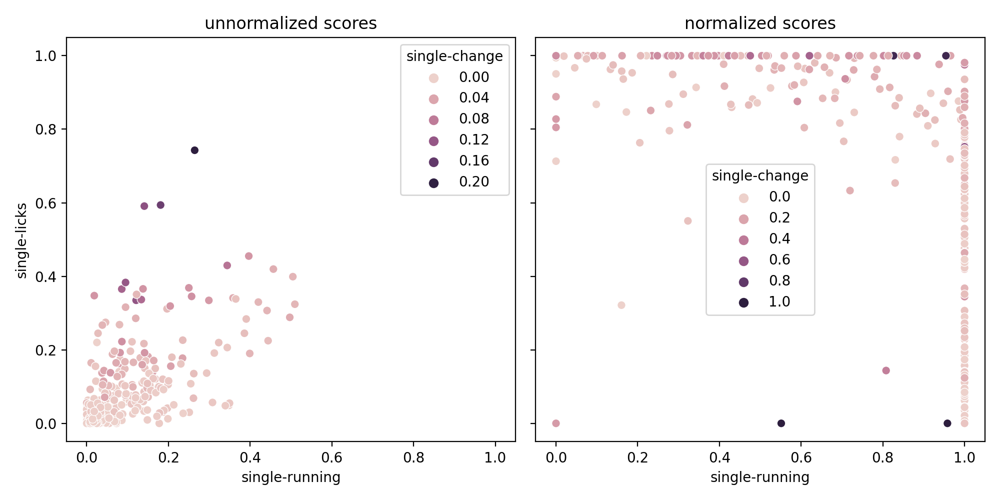

In [215]:
fig, ax = plt.subplots(1,2, figsize = (10,5), sharex=True, sharey=True)
sns.scatterplot(
    data = dropout_summary_simple,
    x = 'single-running',
    y = 'single-licks',
    hue = 'single-change',
    ax = ax[0]
)
sns.scatterplot(
    data = normalized_dropout_df,
    x = 'single-running',
    y = 'single-licks',
    hue = 'single-change',
    ax = ax[1]
)
ax[0].set_title('unnormalized scores')
ax[1].set_title('normalized scores')
fig.tight_layout()

## look at the normalized dropout dataframe in tsne space. Are there clusters?
There aren't clusters. It's more or less continuous. I wonder if these two dimensions are predominantly running and licking? I need to do PCA!!

In [226]:
from sklearn.manifold import TSNE

X = normalized_dropout_df[dropouts_of_interest]
X_embedded = TSNE(n_components=2).fit_transform(X.values)

<IPython.core.display.Javascript object>


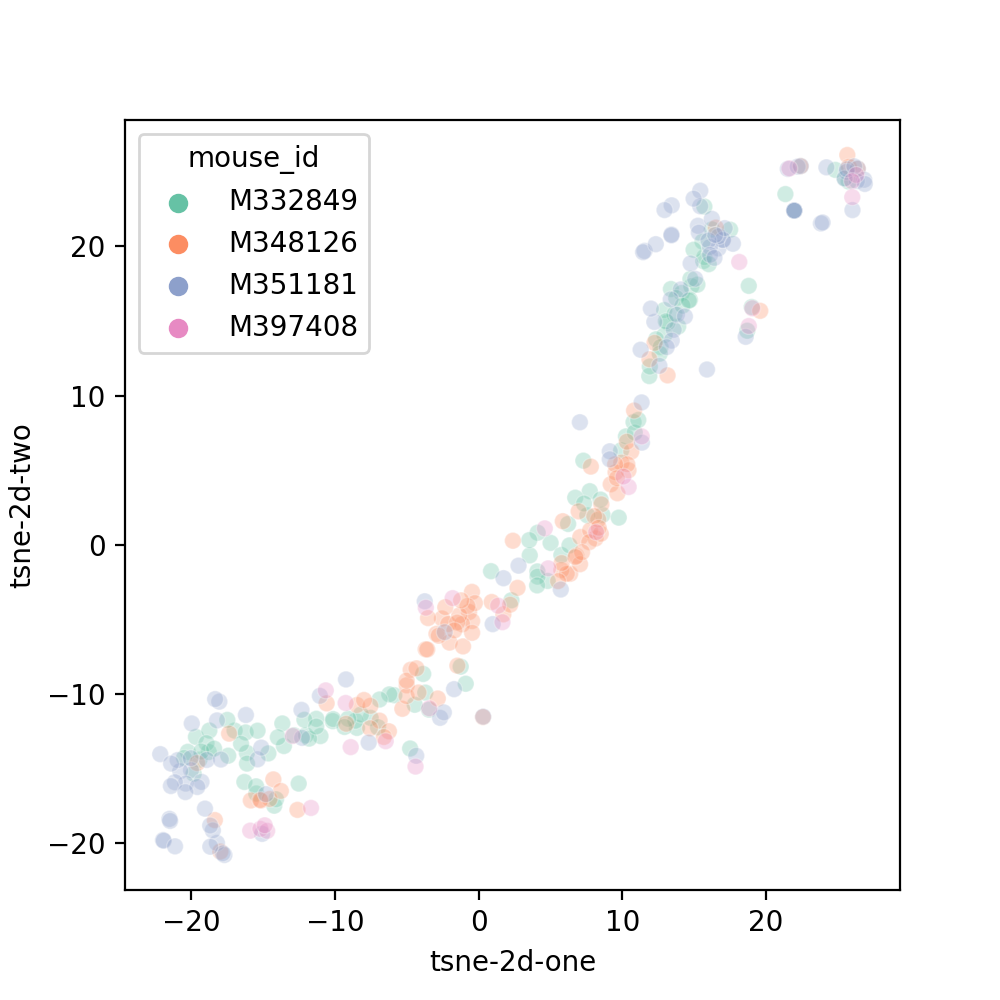

In [227]:
normalized_dropout_df['tsne-2d-one'] = X_embedded[:,0]
normalized_dropout_df['tsne-2d-two'] = X_embedded[:,1]
plt.figure(figsize=(5,5))
ax = sns.scatterplot(
    data=normalized_dropout_df,
    x="tsne-2d-one", 
    y="tsne-2d-two",
    hue="mouse_id",
    palette='Set2',
    legend="full",
    alpha=0.3
)

<IPython.core.display.Javascript object>


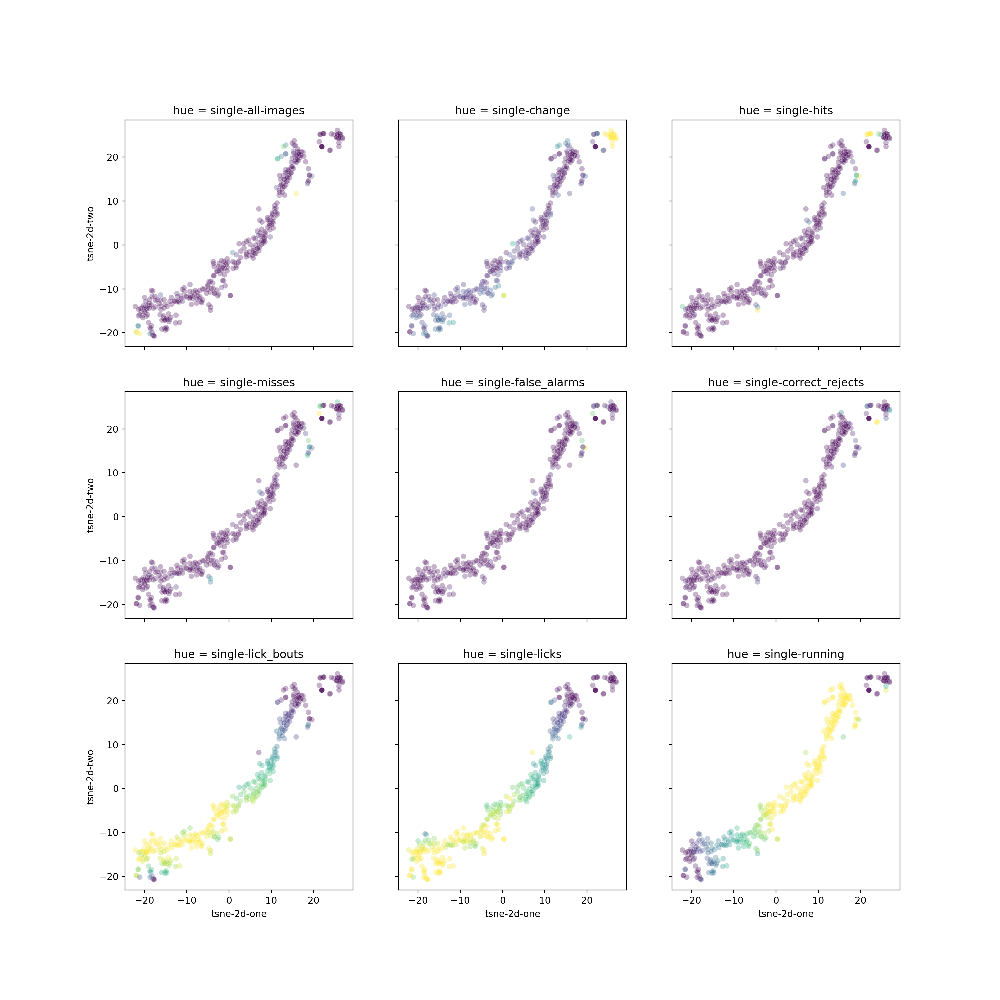

In [228]:
fig, ax = plt.subplots(3,3,figsize = (15,15), sharex = True, sharey = True)

for ii, dropout in enumerate(dropouts_of_interest):
    sns.scatterplot(
        data=normalized_dropout_df,
        x="tsne-2d-one", 
        y="tsne-2d-two",
        hue=dropout,
        palette='viridis',
        legend=False,
        alpha=0.3,
        ax = ax.flatten()[ii]
    )
    ax.flatten()[ii].set_title('hue = {}'.format(dropout))